In [2]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import DataLoader, random_split
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from tqdm.notebook import tqdm

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
dataset = torch.load("../normalizeddataset.pt")


lengths = [
    int(len(dataset) * 0.8),
    int(len(dataset) * 0.1),
    int(len(dataset) * 0.1) + 1
]

# trainset, valset, testset = random_split(dataset, lengths)
# image_datasets = {'train': trainset, 'val': valset, 'test': testset}
# dataloaders = {x: DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True, num_workers=4)
#               for x in ['train', 'val', 'test']}
# dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val', 'test']}  


NC = []
AD = []
for data in dataset:
    if data[1] == 0:
        NC.append(data)
    else:
        AD.append(data)
        
NC = [sample[0] for sample in NC]
NCgan1 = [torch.unsqueeze(sample[0][0], 0) for sample in NC]
NCgan2 = [torch.unsqueeze(sample[1][0], 0) for sample in NC]
NCgan3 = [torch.unsqueeze(sample[2][0], 0) for sample in NC]

batch_size = 64
dataloader1 = DataLoader(NCgan1, batch_size=batch_size, shuffle=True, num_workers=4)
dataloader2 = DataLoader(NCgan2, batch_size=batch_size, shuffle=True, num_workers=4)
dataloader3 = DataLoader(NCgan3, batch_size=batch_size, shuffle=True, num_workers=4)

In [3]:
# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 50

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

In [4]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(

            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
#             nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.ELU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.ELU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.ELU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.ELU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [6]:
fixed_noise = torch.randn(64, nz, 1, 1, device=device)
real_label = 1
fake_label = 0
lr = 2e-4

netG = Generator().to(device)
netG.apply(weights_init)
netD = Discriminator().to(device)
netD.apply(weights_init)

# optimizerD = optim.RMSprop(netD.parameters(), lr=lr)
# optimizerG = optim.RMSprop(netG.parameters(), lr=lr)
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999), weight_decay = 0.01)
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999), weight_decay = 0.01)

img_grids = []
imgs = []
G_losses = []
D_losses = []
    
def train_gan(num_epochs, dataloader):

    iters = 0

    print("Starting Training Loop...")
    # For each epoch
    for epoch in range(num_epochs):
        # For each batch in the dataloader
        for i, data in enumerate(dataloader, 0):

            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            ## Train with all-real batch

            
            netD.zero_grad()
            # Format batch
            real_cpu = data.to(device, dtype = torch.float)

            b_size = real_cpu.size(0)

            label = torch.full((b_size,), real_label, device=device)

            # Forward pass real batch through D
            output = netD(real_cpu).view(-1)

            # Calculate loss on all-real batch
            errD_real = criterion(output, label)

            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()

            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            # Generate fake image batch with G
            fake = netG(noise)
            label.fill_(fake_label)
            # Classify all fake batch with D
            output = netD(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = criterion(output, label)
            # Calculate the gradients for this batch
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Add the gradients from the all-real and all-fake batches
            errD = errD_real + errD_fake
            # Update D
            optimizerD.step()

            for p in netD.parameters():
                p.data.clamp_(-0.01, 0.01)

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            
            if i % 5 == 0: 
                netG.zero_grad()
                label.fill_(real_label)  # fake labels are real for generator cost
                # Since we just updated D, perform another forward pass of all-fake batch through D
                output = netD(fake).view(-1)
                # Calculate G's loss based on this output
                errG = criterion(output, label)
                # Calculate gradients for G
                errG.backward()
                D_G_z2 = output.mean().item()
                # Update G
                optimizerG.step()

            # Output training stats
            if i % 100 == 0:
                print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                      % (epoch, num_epochs, i, len(dataloader), 
                         errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            # Check how the generator is doing by saving G's output on fixed_noise
            if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
                with torch.no_grad():
                    fake = netG(fixed_noise).detach().cpu()
                img_grids.append(vutils.make_grid(fake, padding=2, normalize=True))
                for sample in fake:
                    imgs.append(sample)

            iters += 1

In [17]:
train_gan(1000, dataloader3)

Starting Training Loop...
[0/1000][0/12]	Loss_D: 1.6535	Loss_G: 0.6935	D(x): 0.3807	D(G(z)): 0.3759 / 0.4998
[1/1000][0/12]	Loss_D: 1.3418	Loss_G: 0.6969	D(x): 0.5212	D(G(z)): 0.4985 / 0.4981
[2/1000][0/12]	Loss_D: 1.3103	Loss_G: 0.7004	D(x): 0.5370	D(G(z)): 0.4976 / 0.4964
[3/1000][0/12]	Loss_D: 1.2721	Loss_G: 0.7236	D(x): 0.5472	D(G(z)): 0.4877 / 0.4850
[4/1000][0/12]	Loss_D: 1.2257	Loss_G: 0.7650	D(x): 0.5525	D(G(z)): 0.4684 / 0.4653
[5/1000][0/12]	Loss_D: 1.1796	Loss_G: 0.8009	D(x): 0.5628	D(G(z)): 0.4534 / 0.4489
[6/1000][0/12]	Loss_D: 1.1209	Loss_G: 0.8463	D(x): 0.5758	D(G(z)): 0.4334 / 0.4290
[7/1000][0/12]	Loss_D: 1.0980	Loss_G: 0.8499	D(x): 0.5739	D(G(z)): 0.4182 / 0.4275
[8/1000][0/12]	Loss_D: 1.0570	Loss_G: 0.8988	D(x): 0.5943	D(G(z)): 0.4147 / 0.4071
[9/1000][0/12]	Loss_D: 1.0547	Loss_G: 0.8892	D(x): 0.5943	D(G(z)): 0.4136 / 0.4111
[10/1000][0/12]	Loss_D: 1.1324	Loss_G: 0.8844	D(x): 0.6029	D(G(z)): 0.4647 / 0.4131
[11/1000][0/12]	Loss_D: 1.0781	Loss_G: 0.9116	D(x): 0.5667	D

[98/1000][0/12]	Loss_D: 1.0299	Loss_G: 0.8657	D(x): 0.5508	D(G(z)): 0.3498 / 0.4214
[99/1000][0/12]	Loss_D: 1.3279	Loss_G: 0.8244	D(x): 0.6568	D(G(z)): 0.5948 / 0.4392
[100/1000][0/12]	Loss_D: 0.9412	Loss_G: 1.0342	D(x): 0.6047	D(G(z)): 0.3531 / 0.3560
[101/1000][0/12]	Loss_D: 0.9579	Loss_G: 1.0186	D(x): 0.5959	D(G(z)): 0.3539 / 0.3614
[102/1000][0/12]	Loss_D: 0.9903	Loss_G: 0.9988	D(x): 0.5933	D(G(z)): 0.3722 / 0.3687
[103/1000][0/12]	Loss_D: 1.2790	Loss_G: 0.9450	D(x): 0.4351	D(G(z)): 0.3584 / 0.3891
[104/1000][0/12]	Loss_D: 0.9612	Loss_G: 1.0059	D(x): 0.6218	D(G(z)): 0.3835 / 0.3669
[105/1000][0/12]	Loss_D: 1.1512	Loss_G: 0.7052	D(x): 0.4907	D(G(z)): 0.3534 / 0.4944
[106/1000][0/12]	Loss_D: 1.2100	Loss_G: 0.9082	D(x): 0.4985	D(G(z)): 0.4000 / 0.4034
[107/1000][0/12]	Loss_D: 0.9007	Loss_G: 1.0401	D(x): 0.6366	D(G(z)): 0.3609 / 0.3538
[108/1000][0/12]	Loss_D: 0.9315	Loss_G: 1.0357	D(x): 0.6284	D(G(z)): 0.3722 / 0.3554
[109/1000][0/12]	Loss_D: 0.9042	Loss_G: 1.0449	D(x): 0.6319	D(G(z))

[195/1000][0/12]	Loss_D: 0.8745	Loss_G: 1.0670	D(x): 0.6379	D(G(z)): 0.3453 / 0.3443
[196/1000][0/12]	Loss_D: 1.1065	Loss_G: 0.9463	D(x): 0.6386	D(G(z)): 0.4807 / 0.3896
[197/1000][0/12]	Loss_D: 1.1036	Loss_G: 0.8855	D(x): 0.5189	D(G(z)): 0.3597 / 0.4131
[198/1000][0/12]	Loss_D: 1.3419	Loss_G: 1.0457	D(x): 0.4015	D(G(z)): 0.3471 / 0.3526
[199/1000][0/12]	Loss_D: 1.1813	Loss_G: 0.8889	D(x): 0.4815	D(G(z)): 0.3610 / 0.4148
[200/1000][0/12]	Loss_D: 0.8956	Loss_G: 1.0456	D(x): 0.6406	D(G(z)): 0.3619 / 0.3518
[201/1000][0/12]	Loss_D: 0.9533	Loss_G: 1.0360	D(x): 0.6012	D(G(z)): 0.3571 / 0.3554
[202/1000][0/12]	Loss_D: 0.9003	Loss_G: 1.0439	D(x): 0.6282	D(G(z)): 0.3517 / 0.3526
[203/1000][0/12]	Loss_D: 1.0247	Loss_G: 1.0657	D(x): 0.6422	D(G(z)): 0.4399 / 0.3453
[204/1000][0/12]	Loss_D: 1.1943	Loss_G: 0.9899	D(x): 0.6357	D(G(z)): 0.5227 / 0.3724
[205/1000][0/12]	Loss_D: 0.9283	Loss_G: 1.0368	D(x): 0.6390	D(G(z)): 0.3805 / 0.3551
[206/1000][0/12]	Loss_D: 1.2843	Loss_G: 0.7785	D(x): 0.4588	D(G(z

[292/1000][0/12]	Loss_D: 1.1064	Loss_G: 0.8923	D(x): 0.5199	D(G(z)): 0.3607 / 0.4103
[293/1000][0/12]	Loss_D: 1.3422	Loss_G: 1.0397	D(x): 0.4036	D(G(z)): 0.3504 / 0.3543
[294/1000][0/12]	Loss_D: 0.9605	Loss_G: 1.0356	D(x): 0.6244	D(G(z)): 0.3852 / 0.3558
[295/1000][0/12]	Loss_D: 1.0094	Loss_G: 1.0160	D(x): 0.6089	D(G(z)): 0.3992 / 0.3638
[296/1000][0/12]	Loss_D: 1.4403	Loss_G: 1.0533	D(x): 0.3632	D(G(z)): 0.3460 / 0.3500
[297/1000][0/12]	Loss_D: 1.3252	Loss_G: 1.0339	D(x): 0.4136	D(G(z)): 0.3555 / 0.3567
[298/1000][0/12]	Loss_D: 1.0142	Loss_G: 0.9712	D(x): 0.6116	D(G(z)): 0.4037 / 0.3818
[299/1000][0/12]	Loss_D: 1.3169	Loss_G: 1.0366	D(x): 0.4123	D(G(z)): 0.3467 / 0.3562
[300/1000][0/12]	Loss_D: 1.0745	Loss_G: 0.9190	D(x): 0.5951	D(G(z)): 0.4231 / 0.4035
[301/1000][0/12]	Loss_D: 1.1165	Loss_G: 0.8764	D(x): 0.5105	D(G(z)): 0.3567 / 0.4179
[302/1000][0/12]	Loss_D: 1.0435	Loss_G: 0.9484	D(x): 0.5577	D(G(z)): 0.3646 / 0.3893
[303/1000][0/12]	Loss_D: 0.9204	Loss_G: 1.0295	D(x): 0.6311	D(G(z

KeyboardInterrupt: 

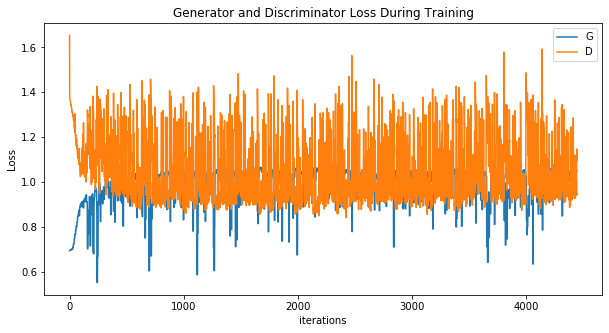

In [18]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

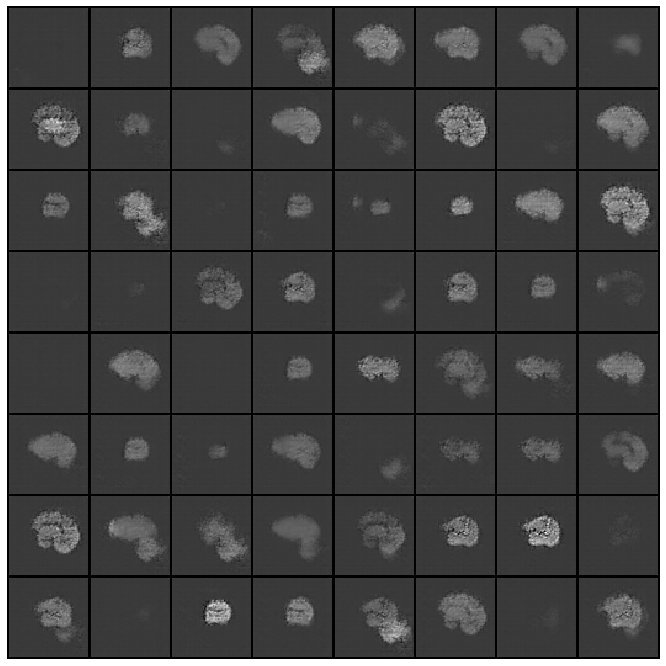

In [19]:
#%%capture
fig = plt.figure(figsize=(12,12))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval= 500, repeat_delay=50, blit=True)

HTML(ani.to_jshtml())

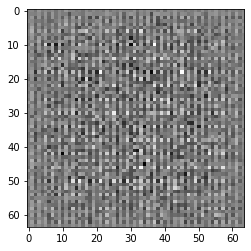

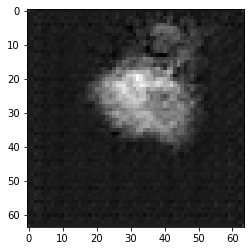

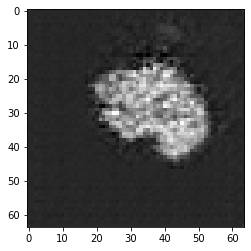

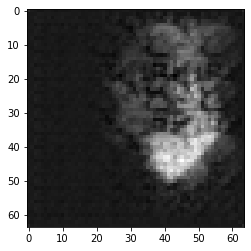

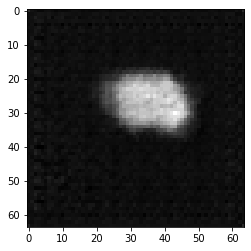

...

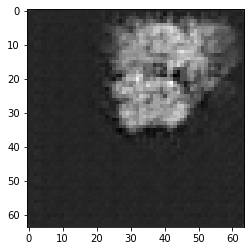

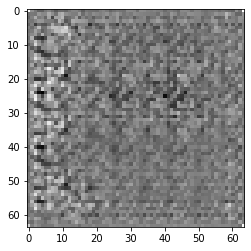

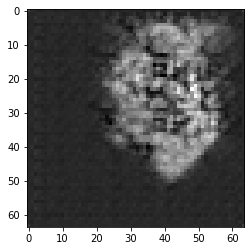

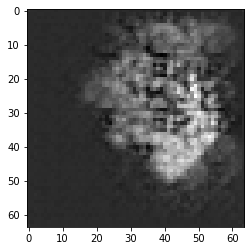

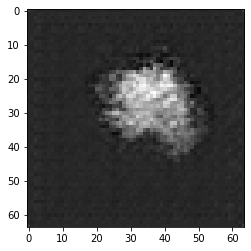

In [30]:
for i in tqdm(range(50)):
    plt.imshow(imgs[-i].reshape(64, 64), cmap = 'gray')
    plt.show()

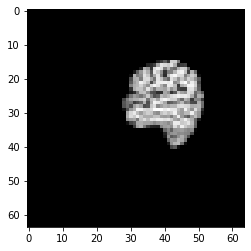

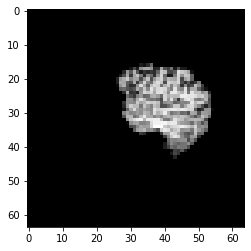

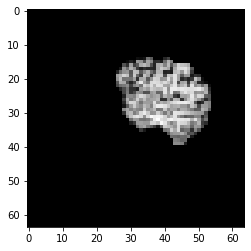

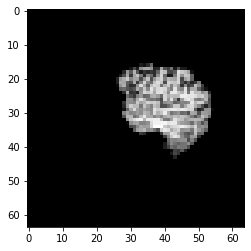

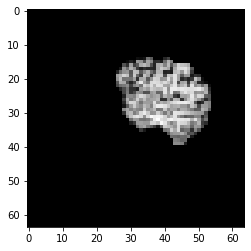

...

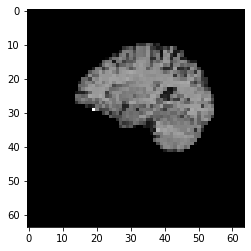

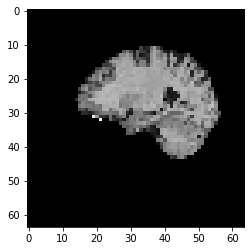

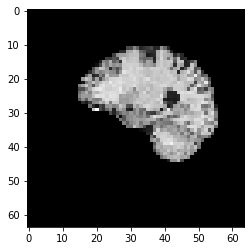

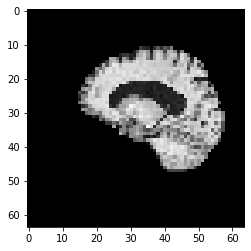

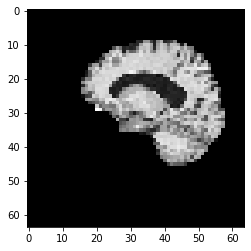

In [40]:
for i in tqdm(range(50)):
    plt.imshow(NCgan3[-i].reshape(64, 64), cmap = 'gray')
    plt.show()

In [38]:
print(imgs[-1].max(), NCgan3[124].max())

tensor(1.2043) tensor(1.3715, dtype=torch.float64)


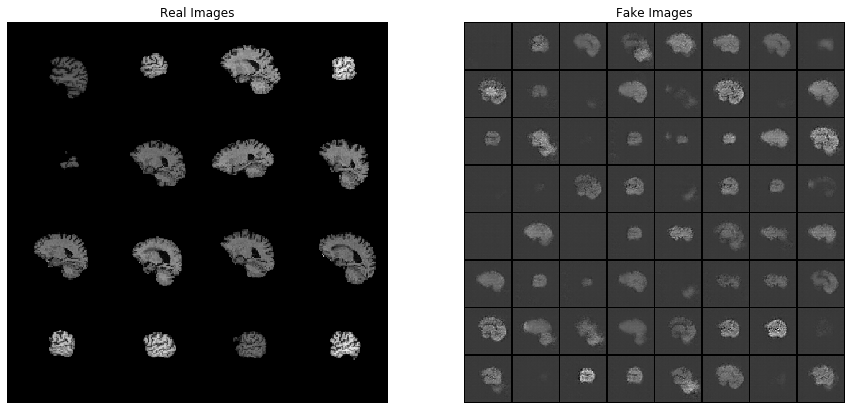

In [31]:
real_batch = next(iter(dataloader3))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device)[:16], nrow = 4, padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [ ]:
real_batch = next(iter(dataloader1))

# Plot the real images
plt.figure(figsize=(15,15))
plt.axis("off")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device), nrow = 4, padding=5, normalize=True).cpu(),(1,2,0)))
